<a href="https://colab.research.google.com/github/miguelamda/DL/blob/master/5.%20Redes%20Convolucionales/Practica5.4.%20Visualizando%20el%20aprendizaje%20de%20CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Práctica 5.4. Visualización de Redes Convolucionales

In [42]:
from tensorflow import keras
keras.__version__

'2.4.0'

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0" 

# 1. Visualizando el Aprendizaje de Redes Convolucionales

A menudo se dice que los modelos DL son *cajas negras* debido que las representaciones aprendidas son difíciles de interpretar por humanos, pero, aunque es cierto en la mayoría de los casos, vamos a ver que no es así para las Redes Convolucionales, donde el hecho de estar trabajando con información visual y basarse en la forma en que se agrupa jerárquicamente esta información, facilita enormemente poder dar una interpretación visual a lo que las diversas capas convolucionales han aprendido. 

Desde 2013 se han generado muchas técnicas para visualizar e interpretar estas representaciones e intentaremos cubrir algunas de las más representativas y accesibles. Concretamente, en este ejemplo vamos a ver cómo:

1. Visualizar las salidas de las capas intermedias (**activaciones intermedias**): útil para comprender cómo las sucesivas capas transformarn sus entradas y para tener una idea inicial de la funcionalidad que tienen los filtros convolucionales individuales.
2. Visualizar filtros convolucionales: útil para entender de forma precisa a qué patrones visuales (o conceptos) son sensibles los diversos filtros.
3. Visualizar **mapas de calor** de las clases de activación sobre muestras (imágenes): útil para entender qué partes de una imagen son identificadas como una clase específica de las reconocidas por la red, lo que, por ejemplo, puede servir además para localizar objetos reconocidos dentro de una imagen.

Para el primer método usaremos la pequeña red que entrenamos desde cero para reconocer gatos y perros. Para los otros dos métodos usaremos el modelo VGG16 que viene preentrenado y que ya hemos usado anteriormente.

### Visualizando Activaciones Intermedias

Visualizar las activaciones intermedias consiste en mostrar el mapa de características que conforman las salidas de las diferentes capas de convolución y pooling de la red para una determinada entrada (la salida de una capa a menudo se llama su **activación**, por ser la salida de su función de activación). 

Este procedimiento da una visión sobre cómo una entrada es descompuesta por las distintas capas aprendidas por la red, y no solo se puede hacer con Redes Convolucionales sino con cualquier tipo de capa, aunque sea en estas redes donde la interpretación visual es más directa. En este caso, los mapas de características tienen 3 dimensiones: anchura, altura y profundidad (canales). Cada canal codifica características relativamente independientes, por lo que la forma más apropiada de visualizar estas características es también representar independientemente los contenidos de cada canal como imágenes 2D. 

Para ponerlo en práctica, comencemos cargando el modelo que generamos en la práctica anterior:

In [ ]:
from keras.models import load_model

model = load_model('cats_and_dogs_DA.h5')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 15, 15, 128)      

Vamos a cargar una imagen de prueba (para que no haya correlación con el aprendizaje llevado a cabo, esta imagen será parte de nuestro conjunto de test, no de entrenamiento):


In [ ]:
# copia de nuevo el dataset
from google.colab import drive
drive.mount('/content/drive')
!cp /content/drive/MyDrive/cat_dogs.zip .
!unzip cat_dogs.zip
drive.flush_and_unmount()

In [ ]:
img_path = 'cat_dogs/test/cats/1820.jpg'

# Vamos a convertir la imagen en un tensor apropiado
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Recordemos que el modelo fue entrenado con entradas normalizadas:
img_tensor /= 255.

# La forma ahora es (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


Usando la función adecuada de `matplotlib` podemos mostrarla:

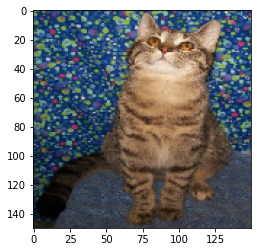

In [ ]:
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

Hemos de tener en cuenta que Keras solo trabaja con modelos, y la información que estamos buscando son las activaciones internas de un modelo ya definido, que el propio no proporciona externamente. Por ello, y con el fin de extraer los mapas de características, vamos a crear un modelo adicional de Keras que toma batches de imágenes como entrada y devuelve las activaciones de todas las capas de convolución y pooling del modelo anteriormente entrenado.

Para ello, usaremos la función `keras_model()`, que toma dos argumentos: un tensor de entrada (en realidad, una lista de tensores de entrada), y un tensor de salida (en realidad, una lista de tensores de salida). El resultado es un modelo de Keras, similar a los que ya hemos creado anteriormente por medio de `keras_sequential_model()` que lleva las entradas proporcionadas en las salidas. Lo que diferencia este tipo de modelos de los anteriores es que permite trabajar con múltiples salidas. Veremos más sobre este tipo de modelos más adelante.

In [ ]:
from keras import models

# Extrae las salidas de las 8 capas superiores:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Crea un modelo que devuelva estas salidas a partir de la entrada:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

Cuando a este modelo se le pasa una imagen de entrada, devuelve los valores de las activaciones de las 8 primeras capas del modelo original. 


In [ ]:
activations = activation_model.predict(img_tensor)

Por ejemplo, la activación de la primera capa convolucional sobre nuestra imagen, sería:


In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


Un mapa de características de tamaño 148 x 148 con 32 canales. Visualicemos algunos de ellos por medio de las funciones de `matplotlib`:


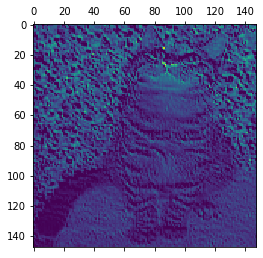

In [ ]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

Por ejemplo, el 6º canal sería:


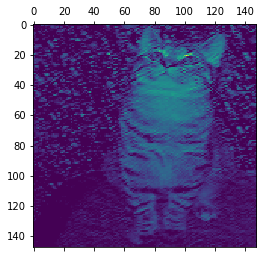

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 5], cmap='viridis')
plt.show()

Si modificas el valor del canal al que accedes podrás observar las diferencias existentes entre los fitros aprendidos en los diferentes canales.

Podemos mostrar una visualización completa de todas las activaciones de la red:


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


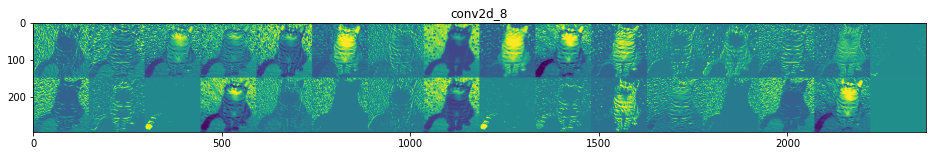

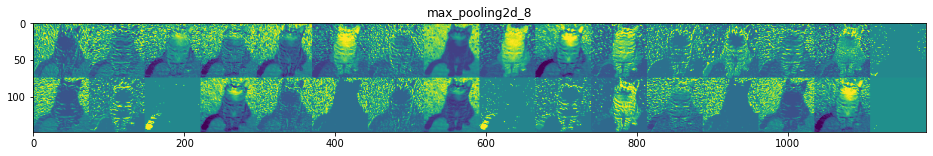

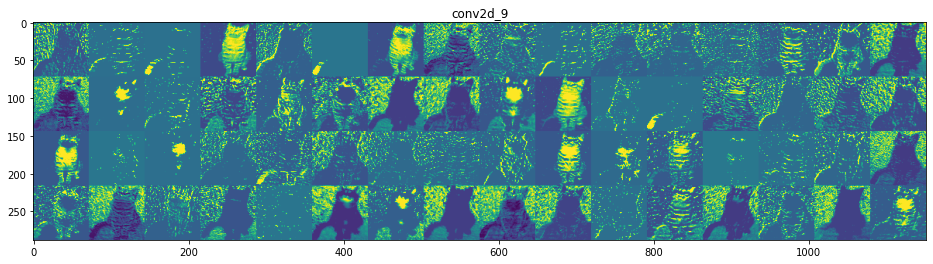

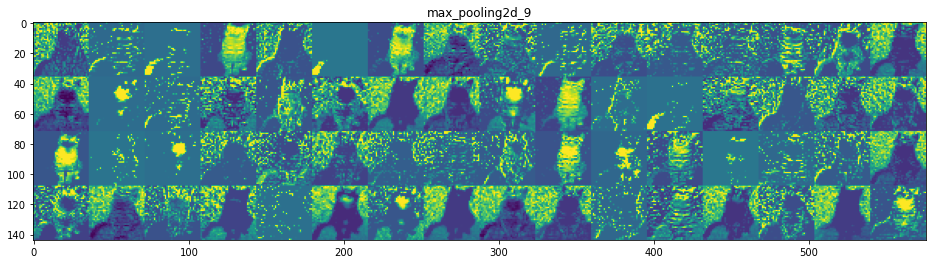

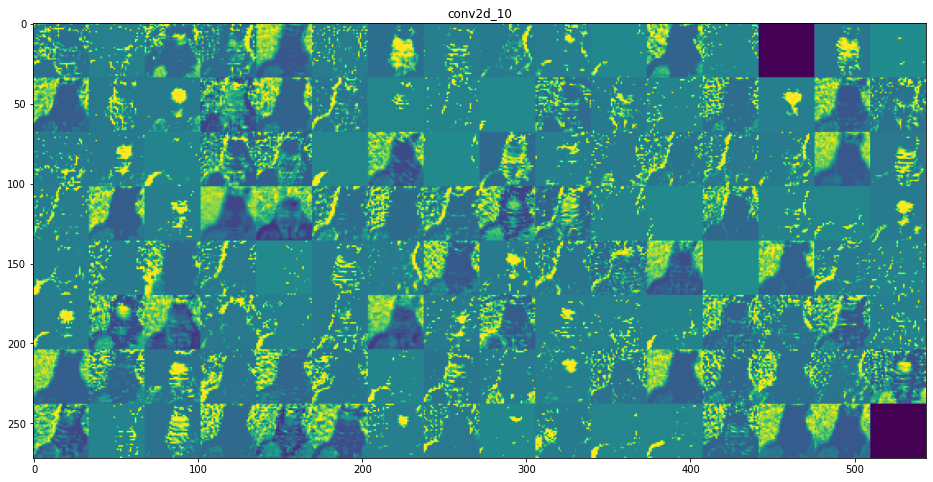

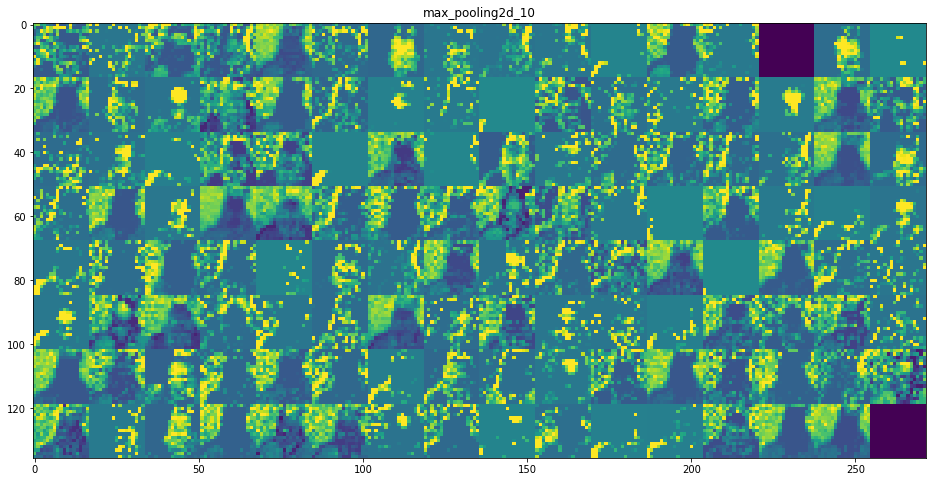

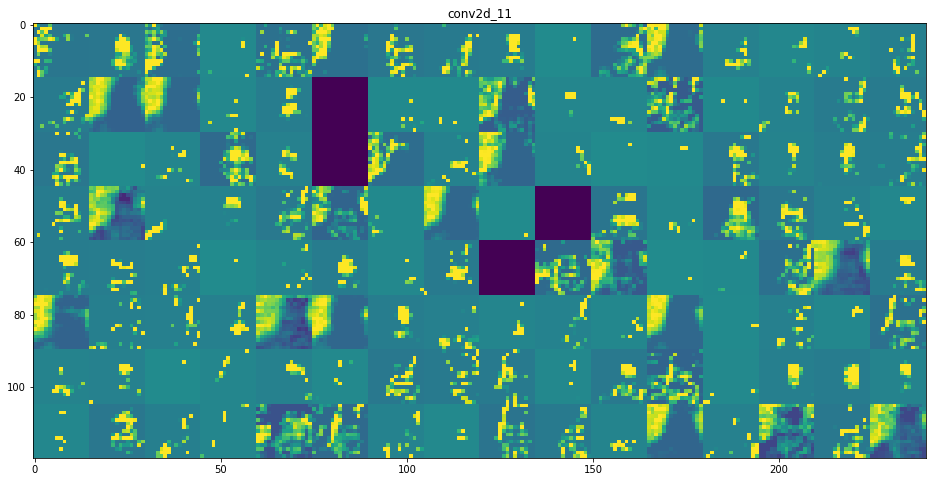

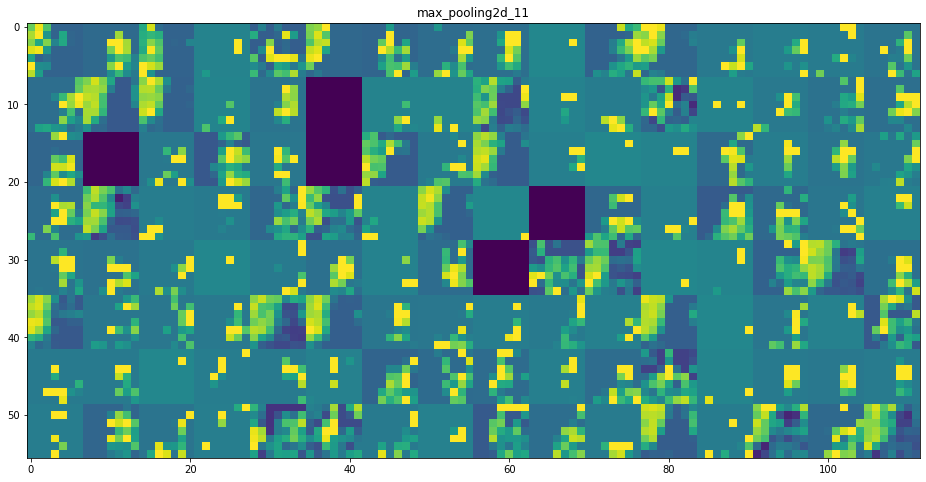

In [ ]:
import keras

# Estos son los nombres de las capas, para poder ponerlos en nuestra figura
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Ahora mostremos nuestros mapas de características
for layer_name, layer_activation in zip(layer_names, activations):

    # El feature map tiene un shape (1, size, size, n_features)
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]

    # En esta matriz pondremos los canales de activación
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # Vamos a poner cada filtro en este gran grid horizontal
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-procesar la característica para hacerlo visulamente aceptable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Mostrar el grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

Algunas cosas que debemos enfatizar:

* La primer capa actúa como una colección de detectores de bordes, y las activaciones prácticamente almacenan toda la información presente en la imagen incial.
* A medida que profundizamos en la red, las activaciones se van haciendo más abstractas y menos interpretables visualmente. Empiezan a codificar conceptos de mayor nivel y menos información visual, más relacionados con la clase a la que pertenece la imagen.
* Las activaciones se hacen más dispersas cuando la profundidad de la capa aumenta: en la primera capa todos los filtros se activan, pero en capas más profundas algunos filtros están en blanco. Esto significa que esos filtros codifican patrones que no están presentes en la imagen de entrada.

De esta forma, una red DL actúa efectivamente como un proceso de **destilación de información**, en el que la información relevante va perdiendo importancia para destacar los conceptos clave que determinan la clasificación. Es análogo a la forma en que los animales percibimos el mundo: tras unos segundos de observar una escena, recordamos información abstracta de los objetos que la componen, pero no podemos recordar detalles específicos de los mismos.

## 2. Visualizando Filtros Convolucionales

Otra forma sencilla de inspeccionar los filtros que ha aprendido una Red Convolucional es mostrando los patrones visuales a los que cada filtro va a responder. Esto se puede hacer por medio de un truco similar a como se entrena la red, lo que se llama __gradiente descendiente en el espacio de entrada__, que consiste simplemente en encontrar la entrada que maximiza la respuesta del filtro.

El proceso es simple (teniendo las herramientas adecuadas): construimos una función de pérdida que maximiza el valor de un filtro determinado de una capa convolucional, comenzamos con una entrada cualquiera (normalmente, en blanco o grises), y usamos un SGD para ajustar los valores de la imagen con el fin de maximizar sus valores de activación.

Vamos a trabajar ahora directamente con VGG16, y no con la red que entrenamos para nuestro problema de perros y gatos. Por ejemplo, el siguiente código muestra cómo definir una función de pérdida adecuada para el filtro 0 de la capa "block3_conv1" de la red VGG16 pre-entrenada con ImageNet:

In [43]:
from keras.applications import VGG16
import tensorflow as tf
import numpy as np

model = VGG16(weights='imagenet',
              include_top=False)

# Capa en la que nos centraremos
layer_name = 'block3_conv1'
# Filtro (o neurona) en el que nos centraremos
filter_index = 0

# Obtenemos los mapas de activación de la capa
layer_output = model.get_layer(layer_name).output

# Creamos un modelo cuya salida es el mapa de activación de la capa seleccionada
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer_output)

# Para el filtro que queremos, la función de pérdida será simplemente la media
# de los valores. Así, cuanto más alta sea la media, mayor será la activación de
# dicho filtro
def compute_loss(input_image, filter_index):
    activation = feature_extractor(input_image)
    # Para evitar problemas con los bordes, quitamos los píxeles de los márgenes
    # del cálculo de la función de pérdida
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

Para implementar el descenso del gradiente necesitamos calcular el gradiente de la función de pérdida respecto a las entradas del modelo, para lo que usaremos el `GradientTape` de Tensorflow (y que vimos en la primera práctica). Además, con el fin de asegurar que la magnitud de las actualizaciones se mantengan en un rango adecuado, normalizaremos el gradiente (dividiéndolo por la norma L2).

Todo esto lo definimos dentro de una función que permite calcular el valor del tensor de pérdida y el gradiente a partir de la imagen de entrada. No te asustes por ver el decorador `@tf.function`, esto simplemente se pone para registrar la función dentro del grafo de tensorflow; en otras palabras, la función se compilará y se ejecutará más rápido.


In [25]:
@tf.function # Este decorador hace que esta función se compile y se ejecute más rápido
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Calcula los gradientes de la función de pérdida respecto de la imagen de entrada
    grads = tape.gradient(loss, img)
    # Normalizamos estos gradientes
    grads = tf.math.l2_normalize(grads)
    # Aquí ajustamos la imagen de entrada en la dirección que maximiza la pérdida
    img += learning_rate * grads
    return loss, img

Una vez construido todo lo anterior, bastaría hacer un bucle para hacer el SGD de forma efectiva:


In [36]:
# Comenzamos con una imagen gris con algo de ruido
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Ejecutamos el ascenso del gradiente durante 40 pasos
learning_rate = 10.0
step = 1.  # esta es la magnitud de cada actualización de gradiente
for i in range(40):
    # Calcula el valor de pérdida y de gradiente
    loss_value, input_img_data = gradient_ascent_step(input_img_data,
                                                      filter_index,
                                                      learning_rate)
    
input_img_data.shape

TensorShape([1, 150, 150, 3])

El resultado es un tensor de imagen (en valores flotantes) de tamaño `(1, 150, 150, 3)`, por lo que hemos de post-procesarlo para convertirlo en valores enteros en  [0, 255] y poder mostrarlo. Vamos a crear una función que haga precisamente eso:


In [37]:
def deprocess_image(x):
    # normaliza el tensor: centrado en 0., asegurando que std es 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # restringe (clip) a [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convertir a array RGB
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

Ahora que tenemos todas las piezas podemos ponerlas juntas en una sola función que toma como entrada el nombre de una capa y un índice de filtro, y devuelve un tensor de imagen que representa el patrón que maximiza la activación de ese filtro:


In [38]:
def generate_pattern(layer_name, filter_index, size=150):
    # Construye una función de pérdida que maximice la activación
    # del filtro n-ésimo de la capa considerada
    layer_output = model.get_layer(layer_name).output
    
    # Comenzamos con una imagen gris con algo de ruido
    img = np.random.random((1, size, size, 3)) * 20 + 128.

    # Elegimos un learning rate
    learning_rate = 10.0

    # Ejecutamos el ascenso del gradiente durante 40 pasos
    step = 1.
    for i in range(40):
        loss_value, img = gradient_ascent_step(img, 
                                               filter_index, 
                                               learning_rate)
        
    return deprocess_image(img[0].numpy())

Vamos a probarlo:


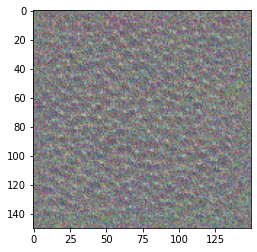

In [39]:
plt.imshow(generate_pattern('block4_conv1', 10))
plt.show()

Lo interesante es que podemos visualizar todos los fitros de cada capa. En el ejemplo siguiente se muestra cómo obtener una visualización de los 64 primeros filtros de cada capa convolucional de los primeros 4 bloques, y los mostramos como una malla de 8x8 patrones:


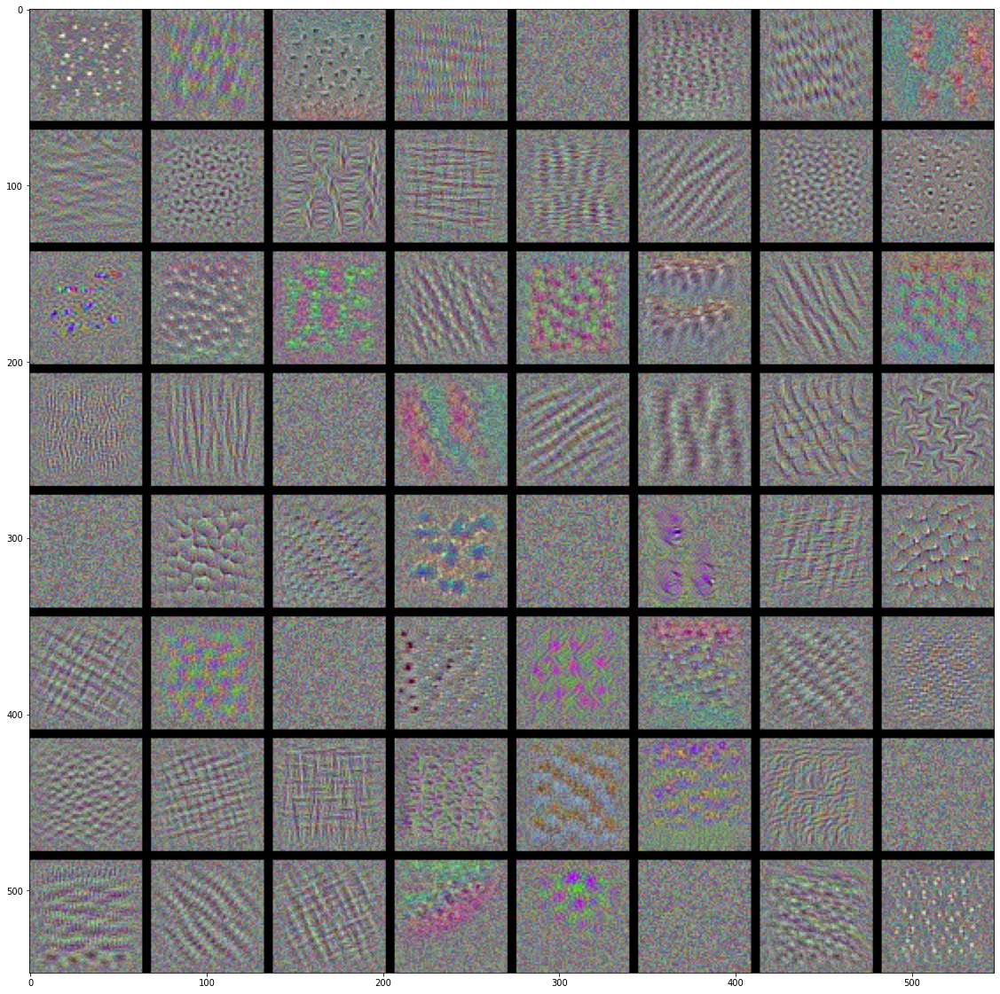

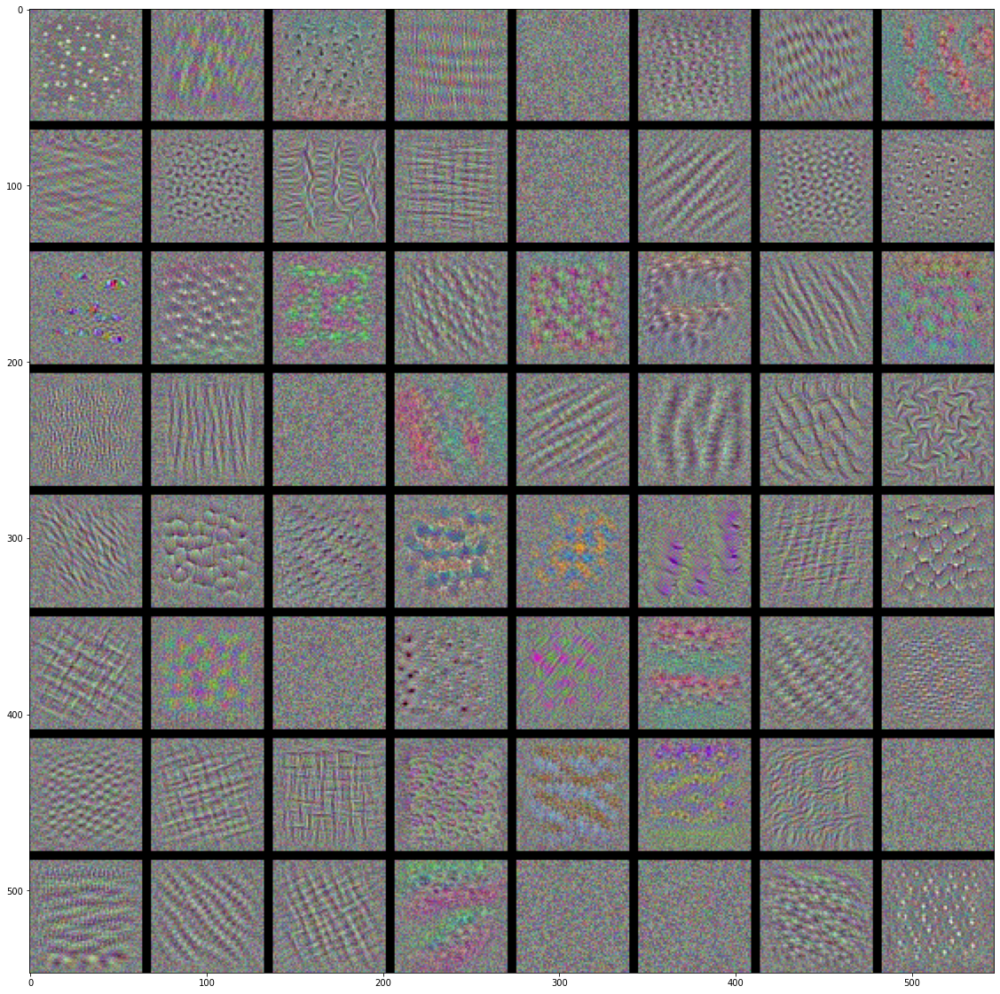

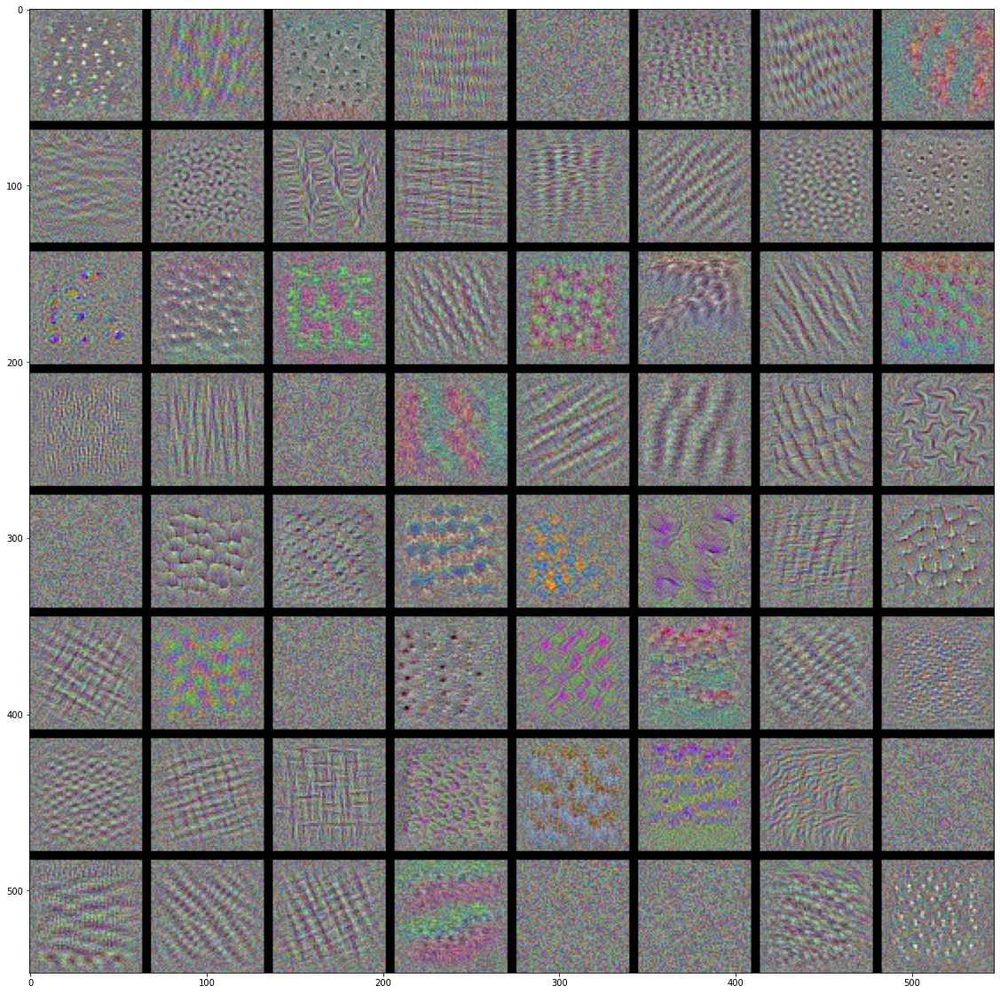

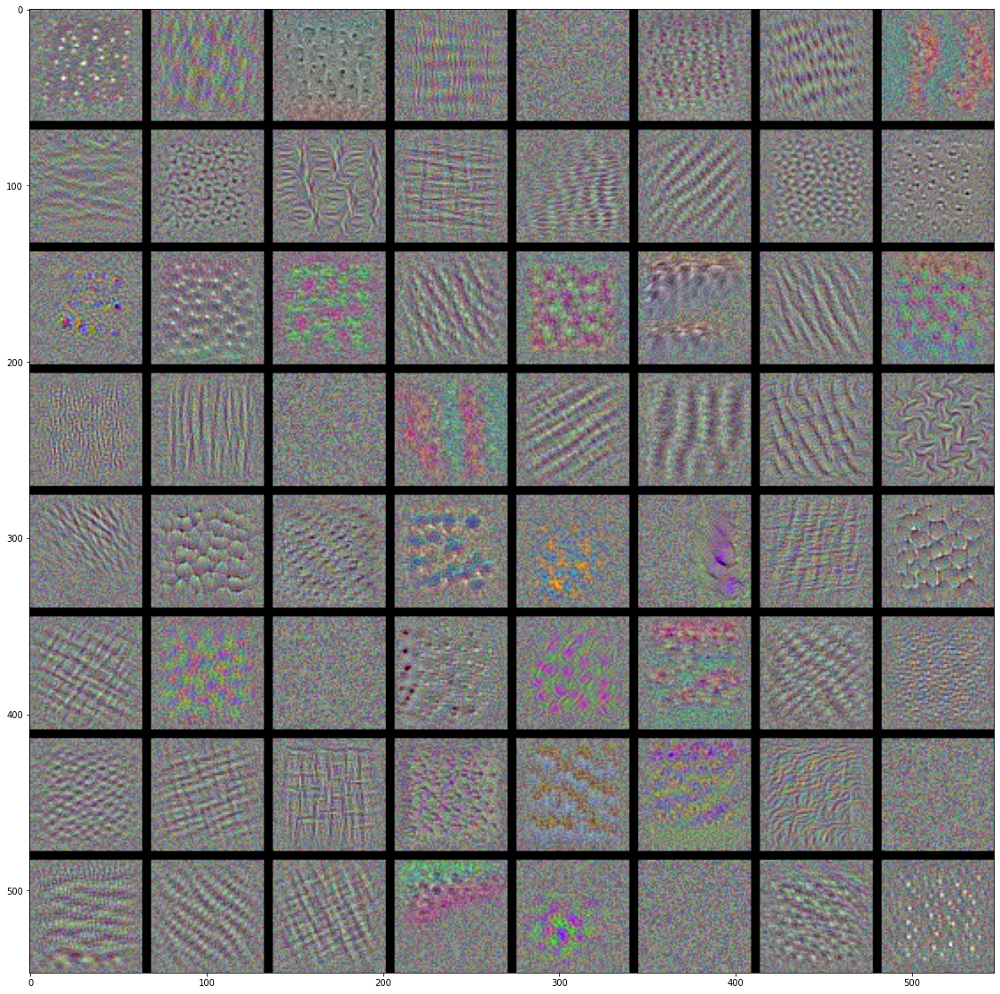

In [40]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # Esto es una imagen vacía (negra) donde iremos almacenando los resultados
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype=np.uint8)

    for i in range(8):  # iterar sobre las filas de nuestro grid de resultados
        for j in range(8):  # iterar sobre las columnas de nuestro grid de resultados
            # Generar el patrón para el filtro `i + (j * 8)` en `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Poner el resultado en la casilla `(i, j)` del grid de resultados
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
            
    # Mostrar el grid de resultados
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

Estas visualizaciones dan mucha información acerca de cómo las capas convolucionales ven el mundo, de forma similar a cómo la transformada de Fourier descompone las señales como una colección de funciones coseno. Observa cómo el patrón de los filtros se vuelve más complejo a medida que se profundiza en la red.

## 3. Visualizando Mapas de Calor de las Activaciones de cada Clase con Grad-CAM

La técnica que introducimos ahora permite visualizar qué partes de una imagen llevan a la red a decidir su clasificación final, lo que puede ser interesante para ver qué errores concretos se producen en errores de clasificación y para especificar dónde están los objetos específicos que se clasifican en una escena.

El nombre general que se le da a esta categoría de técnicas es el de **Mapas de Activación de Clases** y consiste en producir sobre la imagen original un **mapa de calor**, que es una malla 2D con valores asociados a una clase específica indicando la importancia de los pixels que hay debajo para que la clasificación sea esa.

Seguiremos la implementación descrita en ["Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization." Ramprasaath R. Selvaraju et al., Cornell University Library, March 21, 2017](https://arxiv.org/abs/1610.02391).

La idea es muy simple, consiste en tomar el mapa de cartacerísticas de una capa convolucional que produce una imagen de entrada y ponderar cada canal del mapa con el gradiente de la clase con respecto a ese canal. Intuitivamente, lo que se realiza es una poderación de _"cómo activa la imagen de entrada a los diferentes canales"_ con _"cómo de importante es ese canal para la clase resultante"_, obteniendo _"cuánto activa la imagen de entrada la clase"_.

De nuevo, vamos a probar esta técnica usando la red VGG16 preentrenada.

In [44]:
from keras.applications.vgg16 import VGG16

tf.keras.backend.clear_session()

# Observa que ahora sí incluimos la última capa densa clasificadora;
# en todos los casos previos la hemos descartado.
model = VGG16(weights='imagenet')

553467904/553467096 [==============================] - 4s 0us/step


In [54]:
# Mostramos el modelo
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [58]:
# Anotamos el nombre de la última capa convolucional
last_conv_layer_name = "block5_conv3"
# Anotamos el nombre de las capas después de la última convolucional 
# Es decir, la parte del clasificador
classifier_layer_names = [
    "block5_pool",
    "flatten",
    "fc1",
    "fc2",
    "predictions"
]

Vamos a considerar como muestra la siguiente imagen de dos elefantes africanos (que tiene licencia Creative Commons):

![elephants](https://github.com/miguelamda/DL/blob/master/5.%20Redes%20Convolucionales/imgs/creative_commons_elephant.jpg?raw=1)

El primer paso es convertirla a algo que el modelo VGG16 pueda leer. El modelo fue entrenado con imágenes de tamaño 224x224, preprocesadas de acuerdo a las reglas que vienen empaquetadas en la función `imagenet_preprocess_input()`:

In [47]:
# Si estás en local, pon la ruta correcta al archivo
#base_image_path = 'imgs/creative_commons_elephant.jpg'

# Si estás en Google Colab, puedes usar las siguienes líneas para descargar la imagen
# Origen
img_src = "https://github.com/miguelamda/DL/raw/master/5.%20Redes%20Convolucionales/imgs/creative_commons_elephant.jpg"
# La ruta local a nuestra imagen objetivo
img_path = 'creative_commons_elephant.jpg'
# Con keras podemos descargar un fichero así
base_image_path = keras.utils.get_file(img_path, img_src)

196608/190269 [==============================] - 0s 0us/step


In [60]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# `img` es un PIL image de tamaño 224x224
img = image.load_img(base_image_path, target_size=(224, 224))

# `x` es un float32 Numpy array con shape (224, 224, 3)
img_array = image.img_to_array(img)

# Añadimos una dimensión para transformar nuestro array en un "batch"
# de tamaño (1, 224, 224, 3)
img_array = np.expand_dims(img_array, axis=0)

# Finalmente preprocesamos el batch
# (esto hace una normalización por canal de color)
img_array = preprocess_input(img_array)

Ahora podemos ejecutar la red pre-entrenada sobre esta imagen y decodificar su vector de predicción para que sea interpretable:


In [50]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

40960/35363 [==================================] - 0s 0us/step
Predicted: [('n02504458', 'African_elephant', 0.90942085), ('n01871265', 'tusker', 0.0861832), ('n02504013', 'Indian_elephant', 0.00435459)]



Las tres clases principales para esta imagen son

* Elefante Africano (con un 90.9% de probabilidad)
* Tusker (elefante) (con un 8.6% de probabilidad)
* Elefante Indio (con un 0.4% de probabilidad)

Así que la red ha reconocido que nuestra imagen contiene una buena cantidad de información acerca de elefantes africanos, que tiene la clase 387 en la lista de clases posibles (386 si consideramos que comienzan en 0):

In [51]:
np.argmax(preds[0])

386

Para visualizar qué partes de la imagen aportan más información a este predicción vamos a realizar el proceso Grad-CAM al que hacíamos mención anteriormente:


In [62]:
# 1. Comenzamos creando un modelo que mapea la entrada con la última
# capa convolucional de VGG16

# Esta es el mapa de características de salida de la capa `block5_conv3`,
last_conv_layer = model.get_layer(last_conv_layer_name)
# Creamos el modelo que mapea la entrada con esta última capa convolucional
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

# 2. Creamos otro modelo, que esta vez mapea la última capa convolucional 
# con la salida softmax (predicciones de la red)
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
# Vamos recorriendo las capas del clasificador hasta llegar a las predicciones
for layer_name in classifier_layer_names:
    x = model.get_layer(layer_name)(x) # De esta forma recorremos el grafo
# Creamos el modelo
classifier_model = keras.Model(classifier_input, x)

# 3. Calculamos el gradiente de la clase "african elephant" respecto al
# mapa de características de salida de `block5_conv3`. Está escrito de forma genérica.
with tf.GradientTape() as tape:
    # Calculamos las activaciones de la última capa convolucional
    conv_layer_output_value = last_conv_layer_model(img_array)
    # Indicamos que queremos los gradientes hasta esta última capa
    tape.watch(conv_layer_output_value)
    # Calculamos el valor de la predicción
    preds = classifier_model(conv_layer_output_value)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]

# Este es el gradiente de la clase "african elephant" respecto a
# el mapa de características de salida de `block5_conv3`
grads = tape.gradient(top_class_channel, conv_layer_output_value)

# Este es un vector con shape (512,), donde cada entrada es la media de la
# intensidad del gradiente sobre un canal específico del mapa de características
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

# Multiplicamos cada canal en el feature map array
# por "cómo de importante es el canal" respecto a la clase elefante
conv_layer_output_value = conv_layer_output_value.numpy()[0]
pooled_grads = pooled_grads.numpy()
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads[i]

# La media por canal del feature map resultante
# es nuestro mapa de calor (heatmap) de la activación de la clase
heatmap = np.mean(conv_layer_output_value, axis=-1)

Con el fin de visualizar esta información, vamos a normalizar el mapa de calor entre 0 y 1. El resultado se muestra en la figura siguiente:


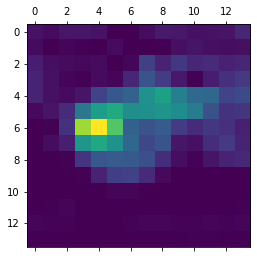

In [63]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Finalmente, usamos el paquete *OpenCV* para generar una imagen que superponga el mapa de calor sobre la imagen original para resaltar las zonas de mayor interés respecto a la clase:


In [65]:
import cv2

# Usamos cv2 para cargar la imagen original
img = cv2.imread(base_image_path)

# Redimensionamos el heatmap para tener el mismo tamaño que la imagen original
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convertimos el heatmap a RGB
heatmap = np.uint8(255 * heatmap)

# Aplicamos el heatmap a la imagen original
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0,4 será un factor de intensidad del heatmap intensity
superimposed_img = heatmap * 0.4 + img

# Guardamos la imagen en disco
cv2.imwrite('elephant_cam.jpg', superimposed_img)

True

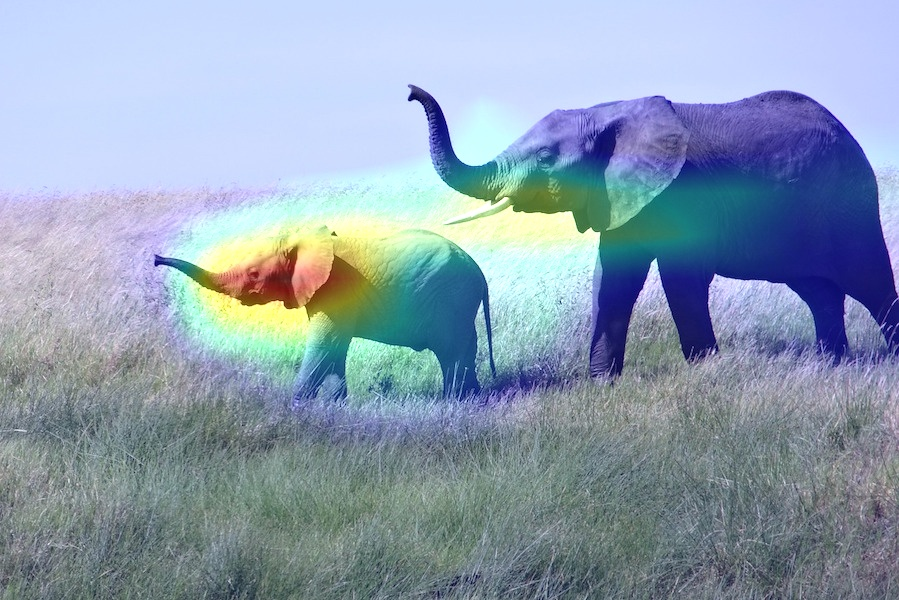

In [66]:
# Visualicemos la imagen creada
from IPython.display import Image
Image(filename="elephant_cam.jpg")

Esta técnica de visualización responde a dos preguntas importantes:

* ¿Porqué la red piensa que la imagen es de un elefante africano?
* ¿Dónde está el elefante africano en la imagen?

En particular, es interesante observar que las orejas del elefante están muy activadas, lo que podría indicar porqué piensa que es africano y no indio.